# Get to know Fernanda

Hello world!

For this Get to Know session, instead of looking at slides we will walk through a Jupyter Notebook, an application that allows editing and running code as well as displaying visuals.

## Why Jupyter for this session?

Because the use of this tool enables me to combine two passions of mine: music and data

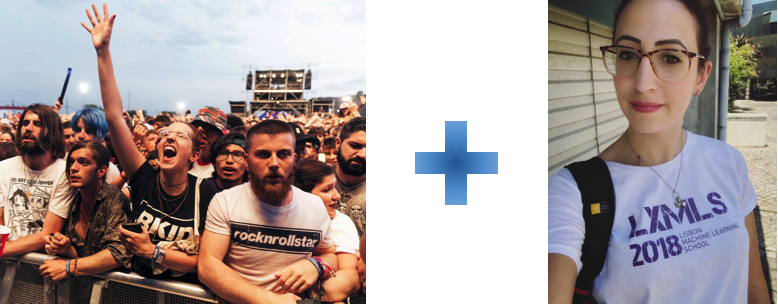

## What will we see here?

Since 2006 I use a service called Last.fm, a platform that registers ("scrobbles") every track I listen to on their system. Until now, I have over 93,000 songs registered, and it represents a lot of who I am and my trajectory.

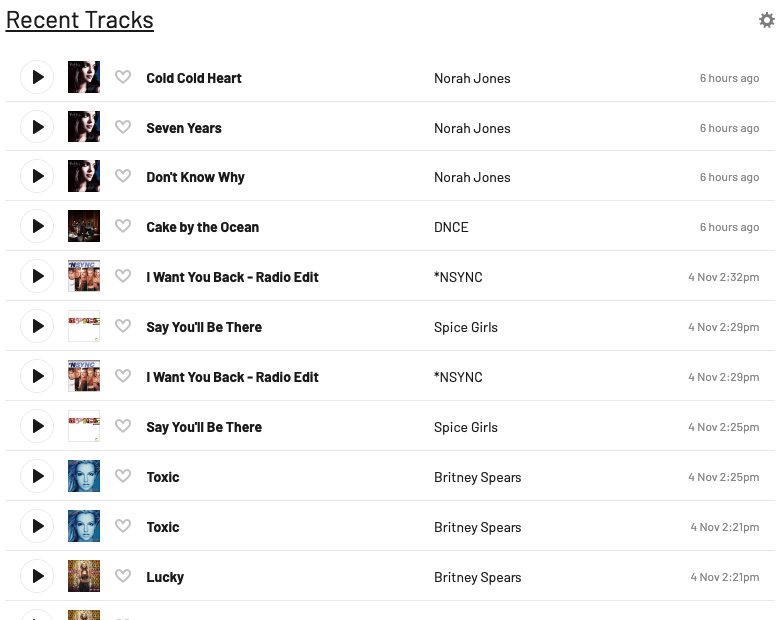

I never knew why I was scrobbling everything I listened to, I just did, and kind of obsessively. After I started working with data I realized that I could combine both to understand my taste, its evolution and how what I listened to could illustrate a little bit of my life.

### Let's go to the geeky part! 🤓

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
import seaborn as sns
import datetime
import csv
from os import listdir, makedirs
from os.path import isfile, join, exists
import shutil
import datetime
from pytz import timezone
import numpy as np

import warnings
warnings.filterwarnings('ignore')

In [2]:
user = 'ohhrosie'

directory = 'export_' + str(user) + '/'
name_file = 'historical_tracks_'

def get_last_file(user, mypath, name_file):
    if not exists(mypath):
        makedirs(mypath)
    onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))
                                            if str(name_file) + str(user) in join(mypath, f)
                                            if 'partial' not in join(mypath, f)]
    if onlyfiles == []:
        return None
    else:
        return max(onlyfiles)

In [3]:
file = get_last_file(user, directory, name_file)

if file == None:
    print('No file found.')

df = pd.read_csv(directory + file, sep=',')

In [4]:
br = timezone('America/Sao_Paulo')
sp = timezone('Europe/Madrid')

date_moved = int(datetime.datetime(2017,2,6,0,0).timestamp())

list_date_formatted = []

for i in range(len(df)):
    date_epoch = int(df.iloc[i]['date'])
    if user == 'ohhrosie' and int(date_epoch) > date_moved:
        date_f = datetime.datetime.fromtimestamp(int(date_epoch), tz=sp)
    else:
        date_f = datetime.datetime.fromtimestamp(int(date_epoch), tz=br)
    list_date_formatted.append(date_f)

df['date_formatted'] = list_date_formatted
df['weekday'] = [datetime.date(idx.year, idx.month, idx.day).strftime('%A') for idx in df['date_formatted']]
df['weekday_num'] = [datetime.date(idx.year, idx.month, idx.day).isoweekday() for idx in df['date_formatted']]
df['hour'] = [idx.hour for idx in df['date_formatted']]
df['month'] = [idx.month for idx in df['date_formatted']]
df['year'] = [idx.year for idx in df['date_formatted']]

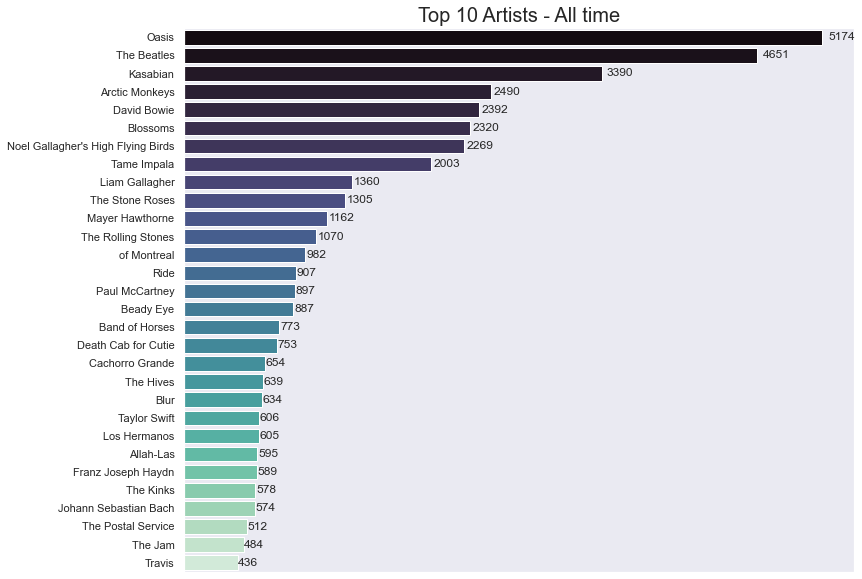

In [5]:
def plot_top(x, y, title='Top 10 Artists - All time'):
    sns.set()
    plt.subplots(figsize=(12, 10))

    palette = sns.cubehelix_palette(15, start=-.8, rot=0.2, reverse=True)

    artists_plot = sns.barplot(y, x, palette='mako')
    artists_plot.axes.get_xaxis().set_visible(False)
    artists_plot.set_title(title, fontsize=20)
    for p in artists_plot.patches:
        artists_plot.text(p.get_width() * 1.01, p.get_y() + p.get_height()/2.,'%d' % int(p.get_width()), 
                fontsize=12, ha='left', va='center')
        
top_artists = Counter(df['artist'])
top_100_artists = top_artists.most_common(30)

x_artists = [item[0] for item in top_100_artists]
y_artists = [item[1] for item in top_100_artists]

plot_top(x_artists, y_artists)

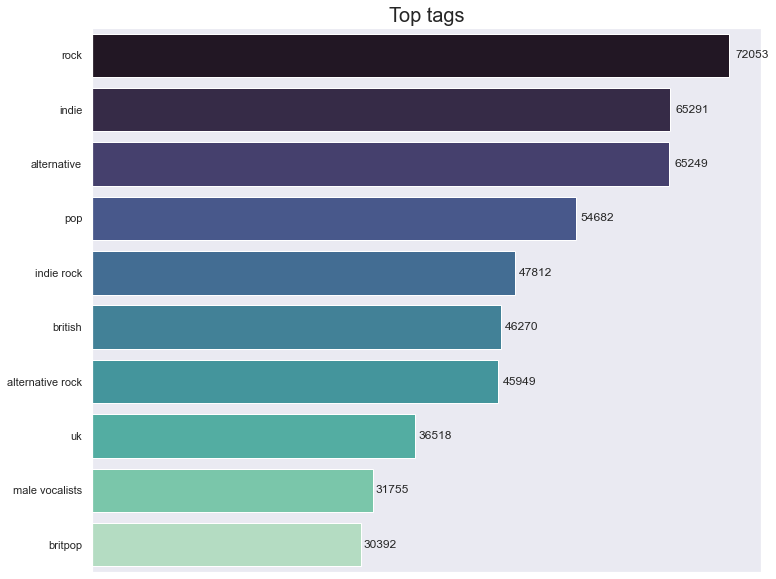

In [6]:
import ast

tags_df = df['tags']
count_tags = {}

for i in range(len(df)):
    str1 = ast.literal_eval(tags_df.iloc[i])
    for j in range(len(str1)):
        if str1[j] not in count_tags:
            count_tags[str1[j]] = 1
        elif str1[j] in count_tags:
            count_tags[str1[j]] += 1
            
top_tags = Counter(count_tags)
top_100_tags = top_tags.most_common(100)

x_tags = [item[0] for item in top_100_tags][:10]
y_tags = [item[1] for item in top_100_tags][:10]
title = 'Top tags'

plot_top(x_tags, y_tags, title=title)

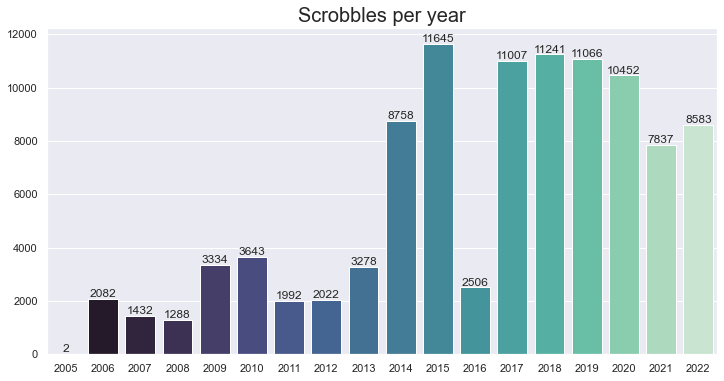

In [7]:
def plot_years(df):

    years = sorted(list(df['year'].unique()))
    tracks_per_year = [len(df[df['year'] == i]) for i in years]

    sns.set()
    plt.subplots(figsize=(12, 6))
    yearly_tracks = sns.barplot(years, tracks_per_year, palette='mako')
    yearly_tracks.set_title('Scrobbles per year', fontsize=20)
    for p in yearly_tracks.patches:
        yearly_tracks.text(p.get_x() + p.get_width()/2., p.get_height(), '%d' % int(p.get_height()), 
                fontsize=12, ha='center', va='bottom')
plot_years(df)

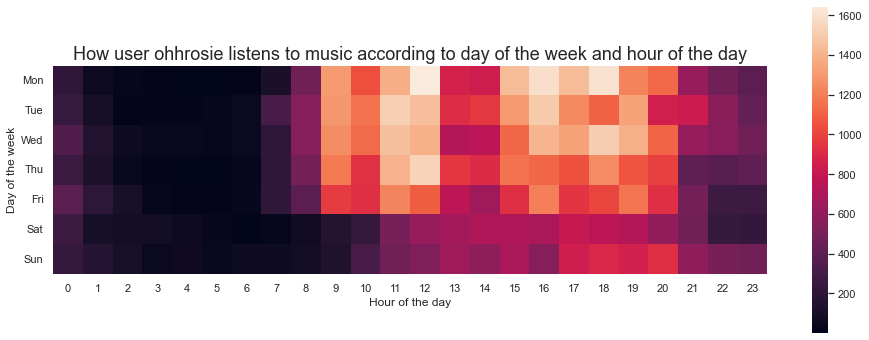

In [8]:
def plot_heatmap(df):
    matrix_hour_weekday = df.pivot_table(index='weekday_num', 
                   columns='hour',
                   aggfunc='size',
                   fill_value=0)

    f, ax = plt.subplots(figsize=(16, 6))
    heatmat_hour_weekday = sns.heatmap(matrix_hour_weekday, square=True,
                                       yticklabels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])

    title = 'How user ' + str(user) + ' listens to music according to day of the week and hour of the day'
    heatmat_hour_weekday.set_title(title, fontsize=18)
    plt.yticks(rotation=0)
    plt.xlabel('Hour of the day')
    plt.ylabel('Day of the week')
    plt.show()

plot_heatmap(df)

## Yearly view

I have a very diverse background, and to show this we'll combine with what I was listening to over the years.

## 2006-2008: the Physics years

I have a Bachelor degree in Physics (with a "minor" in Astrophysics). In this period, I was started an internship in a brokerage house and didn't have much time to listen to music, but the time I had I used to discover new bands.

Also, in this period we still didn't have smartphones, and I listened to everything on my iPod! I was always commuting and had to check for new bands on my computer, download the music, add to my iPod etc etc etc. Oh those were the days!

In [9]:
d6 = df[df.year == 2006]
d7 = df[df.year == 2007]
d8 = df[df.year == 2008]

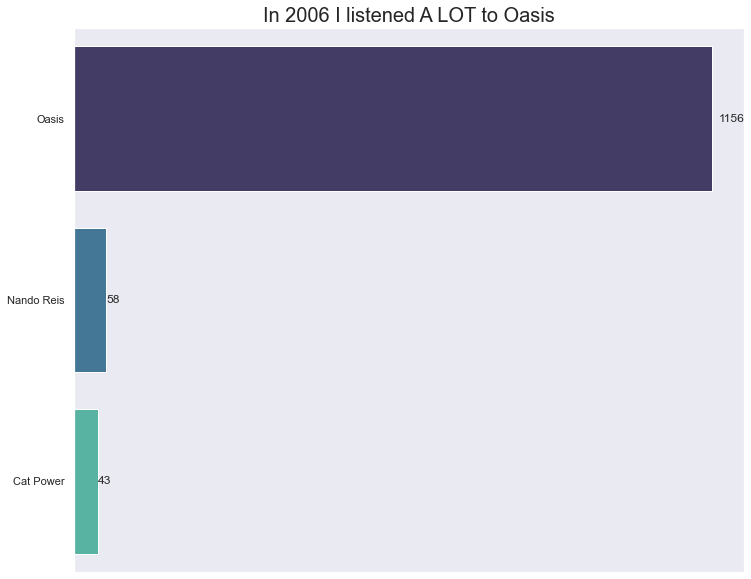

In [10]:
top_artists = Counter(d6['artist'])
top_3_artists = top_artists.most_common(3)

x_artists = [item[0] for item in top_3_artists]
y_artists = [item[1] for item in top_3_artists]
title = 'In 2006 I listened A LOT to Oasis'

plot_top(x_artists, y_artists, title)

As you can see, in 2006 I listened A LOT to Oasis. In this year I went to their concert, and I was obsessed. I was really close to the stage and even slept close to the venue to be there soon enough for the gig.

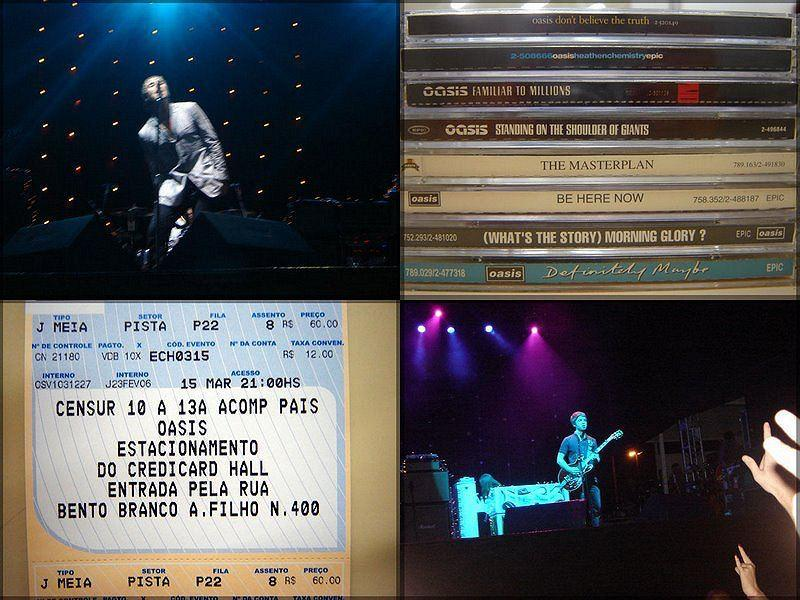

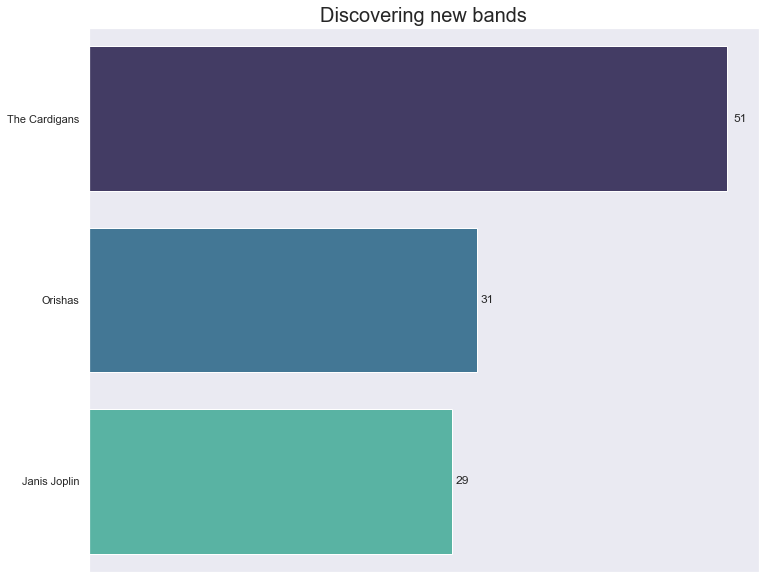

In [11]:
top_artists = Counter(d7['artist'])
top_3_artists = top_artists.most_common(3)

x_artists = [item[0] for item in top_3_artists]
y_artists = [item[1] for item in top_3_artists]
title = 'Discovering new bands'

plot_top(x_artists, y_artists, title)

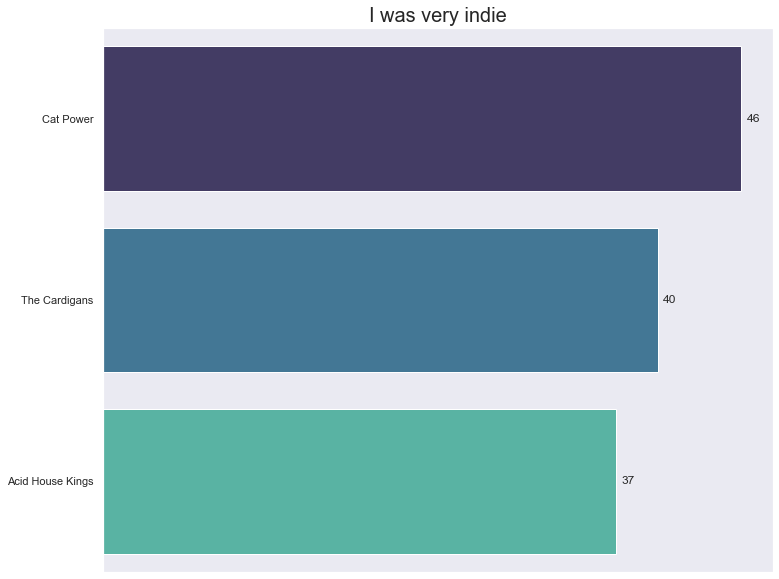

In [12]:
top_artists = Counter(d8['artist'])
top_3_artists = top_artists.most_common(3)

x_artists = [item[0] for item in top_3_artists]
y_artists = [item[1] for item in top_3_artists]
title = 'I was very indie'

plot_top(x_artists, y_artists, title)

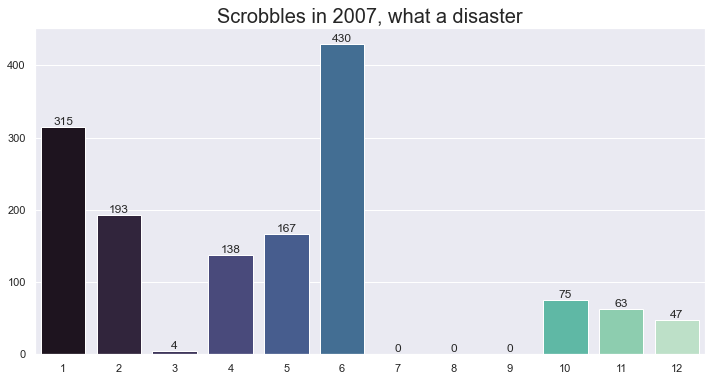

In [13]:
months = sorted(list(df['month'].unique()))
tracks_per_month = [len(d7[d7['month'] == i]) for i in months]

sns.set()
plt.subplots(figsize=(12, 6))
yearly_tracks = sns.barplot(months, tracks_per_month, palette='mako')
yearly_tracks.set_title('Scrobbles in 2007, what a disaster', fontsize=20)
for p in yearly_tracks.patches:
    yearly_tracks.text(p.get_x() + p.get_width()/2., p.get_height(), '%d' % int(p.get_height()), 
            fontsize=12, ha='center', va='bottom')

I graduated in 2008 and I was VERY stressed out. I had been studying and working a lot, and I couldn't listen to much music. This is how much I listened to:

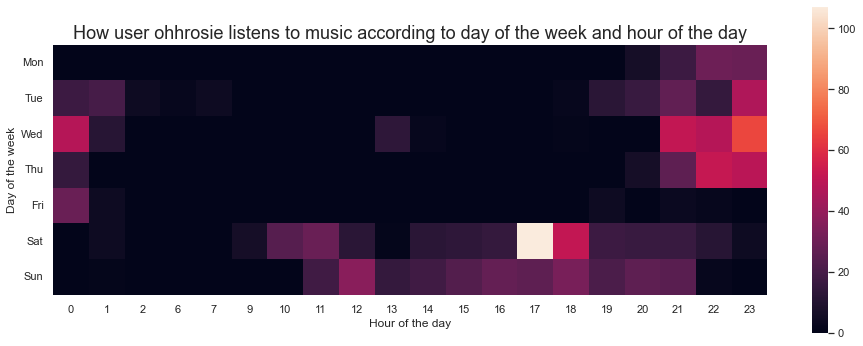

In [14]:
plot_heatmap(d8)

## 2009-2012: The Sheep of Wall Street

From 2009 to 2012 I was intensely working in the financial market. I worked as a stock trader for foreigner investors (pensions funds, mostly). I saw the whole crisis unfold and banks melt before my eyes, it was a very crazy period. I knew I was not a fit for that sector, but I'm grateful for people I met and a lot of what I learned.

I also had the opportunity to spend 2 weeks in South Korea and boy oh boy it was crazy!

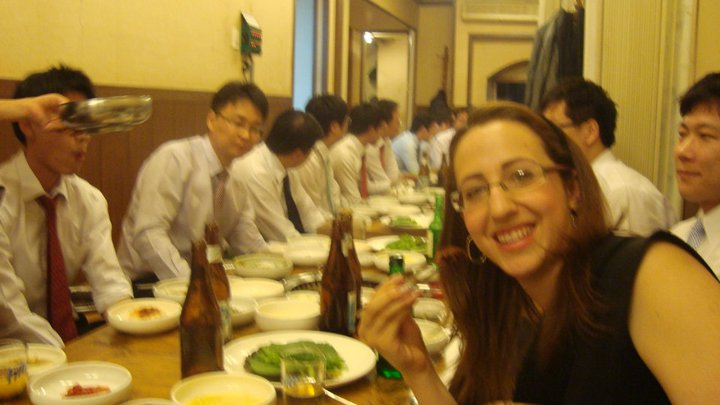

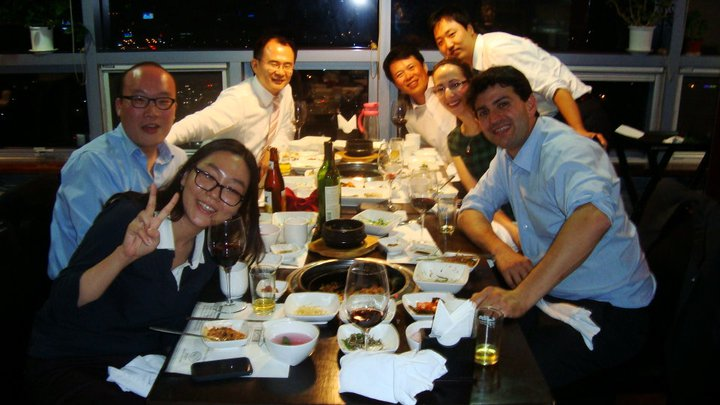

In this period I also didn't almost have time to listen to music, but we have more records because I had smartphones and easier connection to internet.

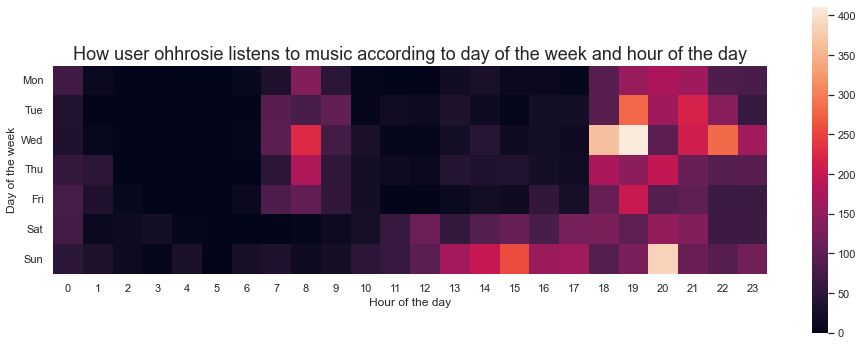

In [15]:
d9 = df[df.year == 2009]
d10 = df[df.year == 2010]
d11 = df[df.year == 2011]
d12 = df[df.year == 2012]

dsheep = df[(df.year >= 2009) & (df.year <= 2012)]

plot_heatmap(dsheep)

![title](https://i.kym-cdn.com/photos/images/newsfeed/001/414/503/eac.jpg)

What made me going in these years was music and concerts.

In this period I listened mostly to the Beatles and Oasis. In 2010 I went to Paul McCartney concerts because I could swear that old man was about to die (???) and Oasis split in 2009 (after I went to 3 concerts, so I was also mourning their separation.)

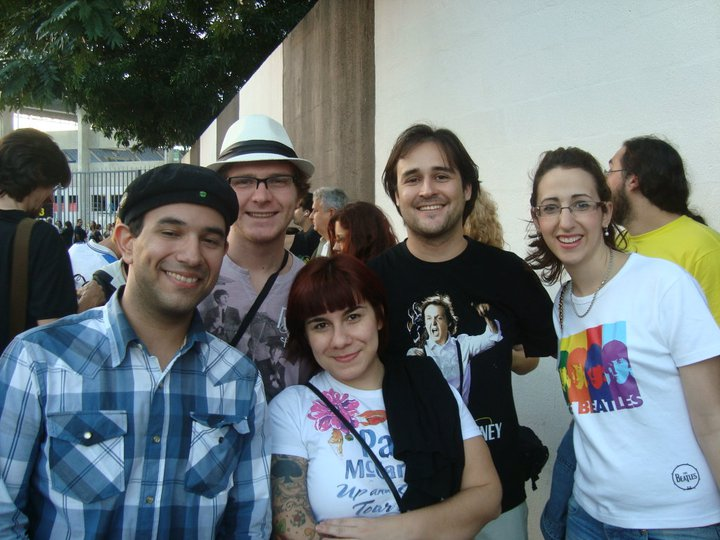

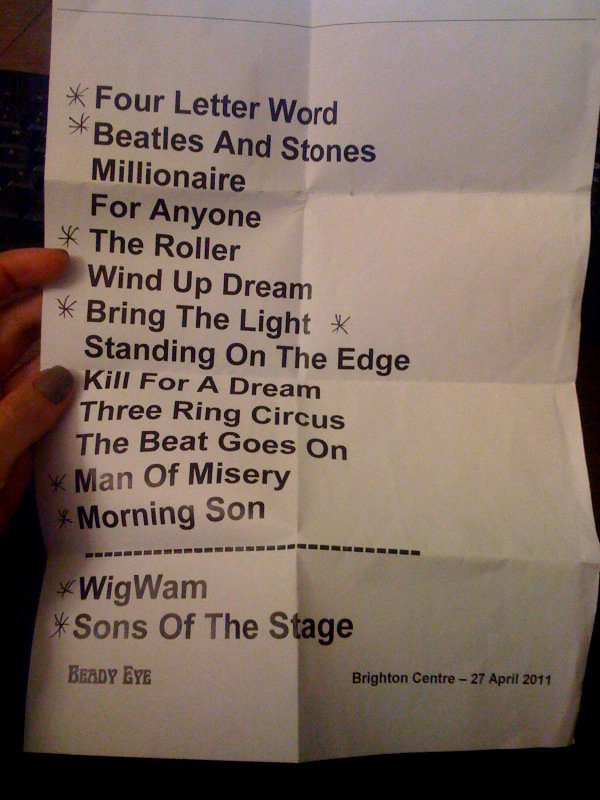

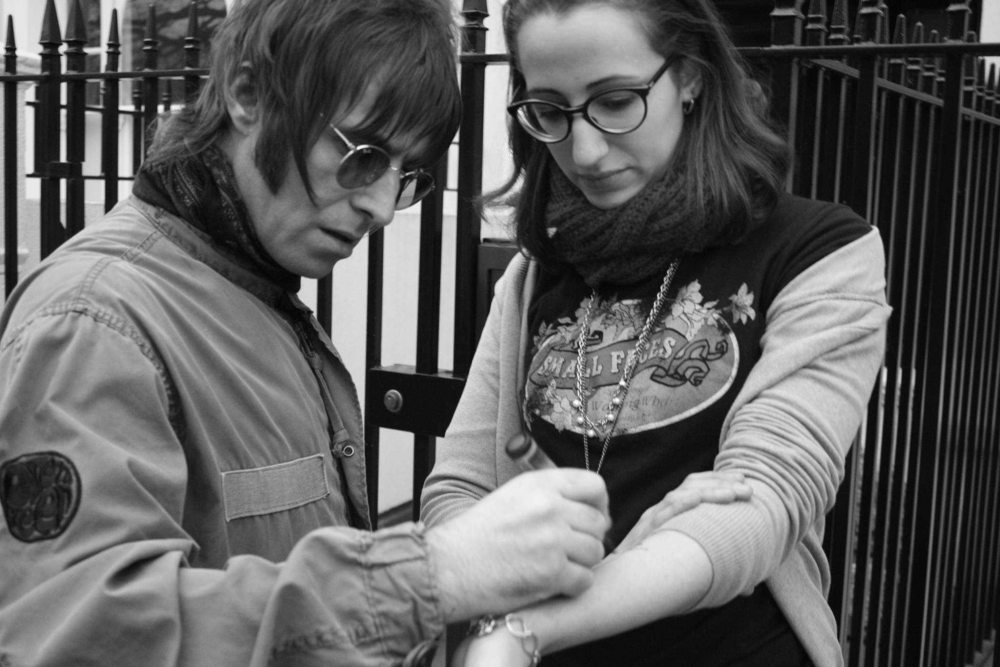

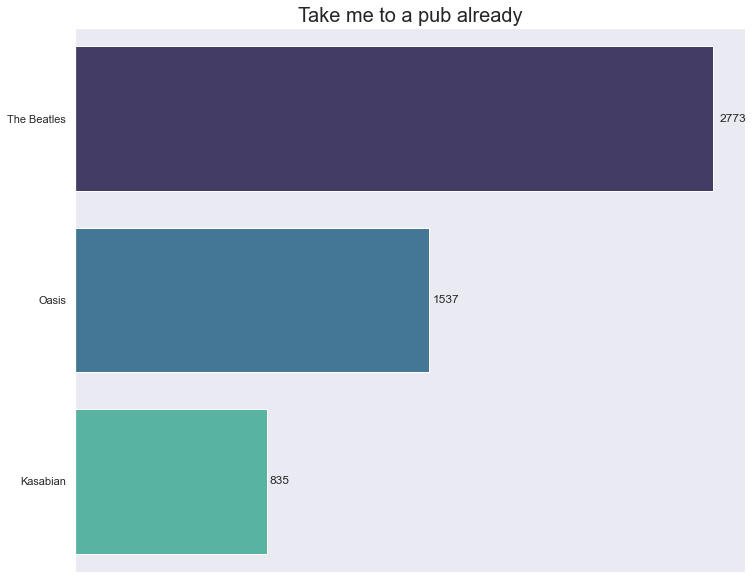

In [16]:
top_artists = Counter(dsheep['artist'])
top_3_artists = top_artists.most_common(3)

x_artists = [item[0] for item in top_3_artists]
y_artists = [item[1] for item in top_3_artists]

plot_top(x_artists, y_artists, title="Take me to a pub already")

## 2012-2016: Tiny dancer

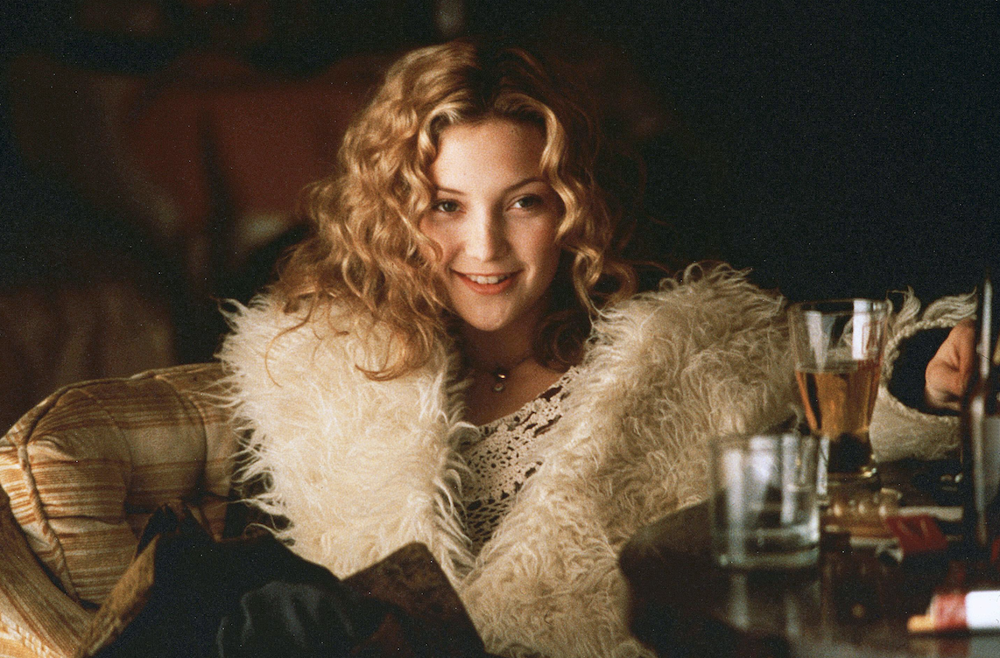

I always knew that I didn't "belong" to financial markets and my time there was running out. As I still looked for my passion, I started working in the music industry. I wasn't talented to play any instruments, so I worked on a more logistic part of scheduling bands for concerts and getting our staff ready, and I really enjoyed it. I was living the dream: going to 3 concerts per week, being surrounded by artistic people and with a busy night life.

Since I was always walking around and listening to music live as I worked, my dataset for this period is also not super great especially in the beginning. As the time passed, I was focusing more on "office" tasks instead of floor operations, and I could listen to music as I worked.

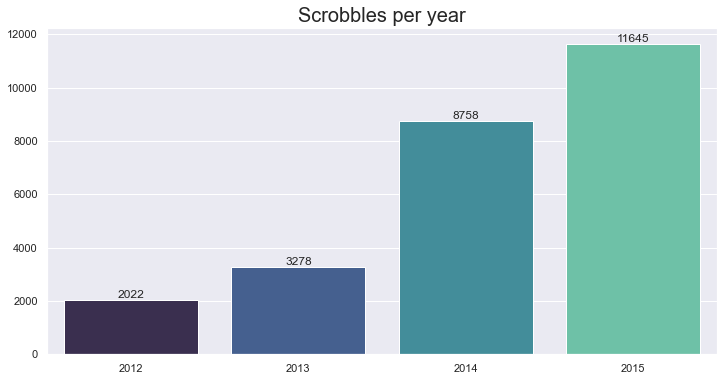

In [17]:
d13 = df[df.year == 2013]
d14 = df[df.year == 2014]
d15 = df[df.year == 2015]
d16 = df[df.year == 2016]

dtiny = df[(df.year >= 2012) & (df.year <= 2015)]
plot_years(dtiny)

In [18]:
years = sorted(list(df['year'].unique()))

d = {}

for i in years:
    d[i] = 0

tags_df = df['tags']
count_tags = {}

for i in range(len(df)):
    str1 = ast.literal_eval(tags_df.iloc[i])
    for j in range(len(str1)):
        if 'brazil' in str1[j] or 'brasil' in str1[j]:
            d[df.iloc[i]['year']] += 1

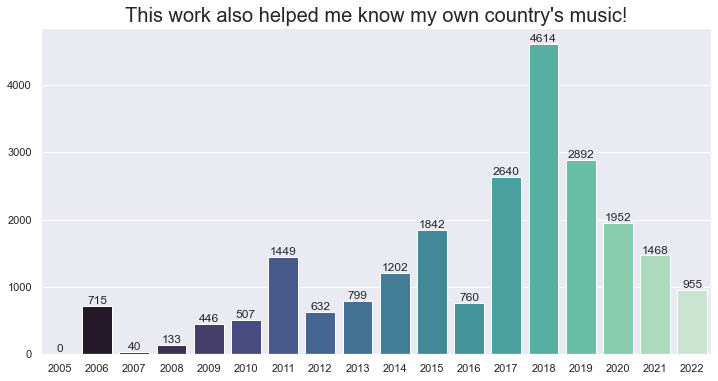

In [19]:
x_brazil = list(d.values())
y_brazil = list(d.keys())

sns.set()
plt.subplots(figsize=(12, 6))
yearly_tracks = sns.barplot(y_brazil, x_brazil, palette='mako')
yearly_tracks.set_title("This work also helped me know my own country's music!", fontsize=20)
for p in yearly_tracks.patches:
    yearly_tracks.text(p.get_x() + p.get_width()/2., p.get_height(), '%d' % int(p.get_height()), 
            fontsize=12, ha='center', va='bottom')

We can also see how in this period I listened to music mainly when I was at work

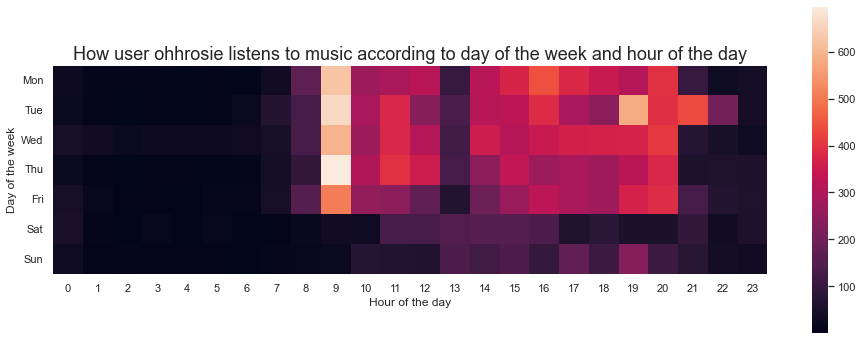

In [20]:
plot_heatmap(dtiny)

It was a very artsy and frenetic period, but I enjoyed every second of it! I made really great friends and got to know many underground brazilian bands that I would never have met other way

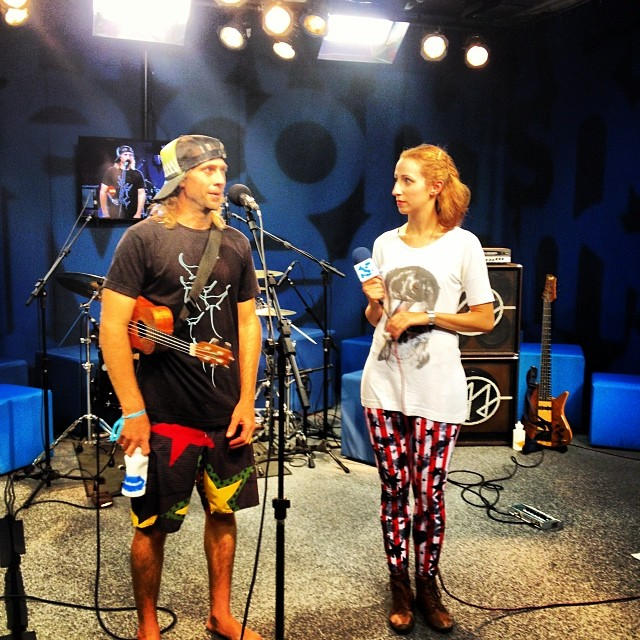

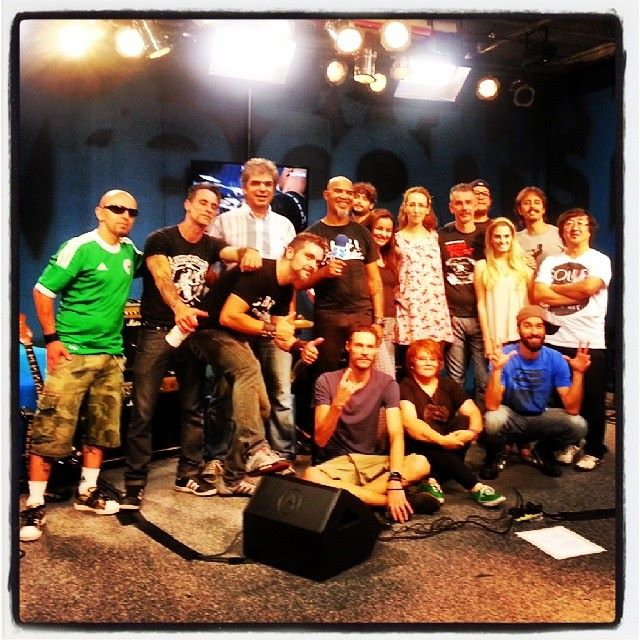

## 2016-present days: Back to the numbers

Although I loved working with music, I missed studying and dealing with numbers. Talking to my brother (my best friend) I started thinking about "big data" and took a look at coursed on edx. By the end of 2015 I took some courses and decided I was pivoting careers. I still had to work full time with music but I studied on my spare time.

In 2016 a big financial crisis hit Brazil, and the company I was working for was going bankrupt. They let me go, and from August to December all I did was study Python and Data Science intensely, and this is why my scrobbles dropped drastically.

In [21]:
d17 = df[df.year == 2017]
d18 = df[df.year == 2018]
d19 = df[df.year == 2019]
d20 = df[df.year == 2020]
d21 = df[df.year == 2021]
d22 = df[df.year == 2022]

dnumb = df[(df.year >= 2016) & (df.year <= 2021)]

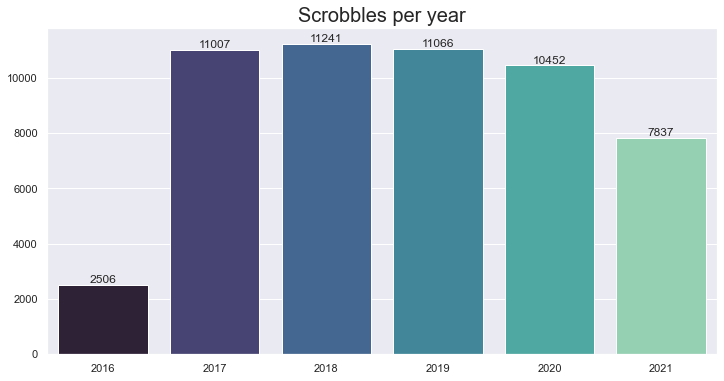

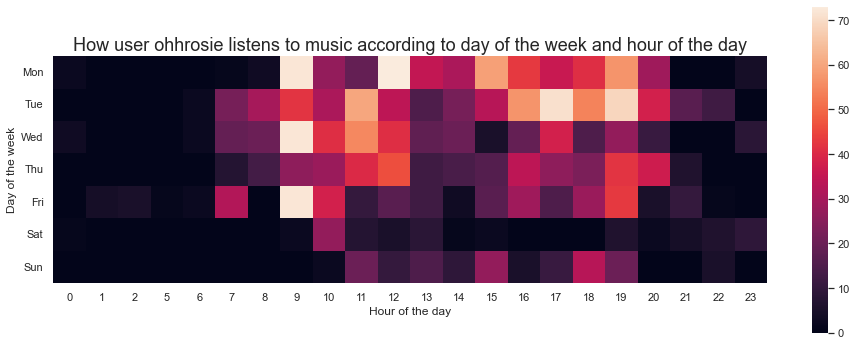

In [22]:
plot_years(dnumb)

plot_heatmap(d16)

In 2017 I came to Spain, and remember the Brazilian music spike in 2018? This is called Feeling Homesick <3.

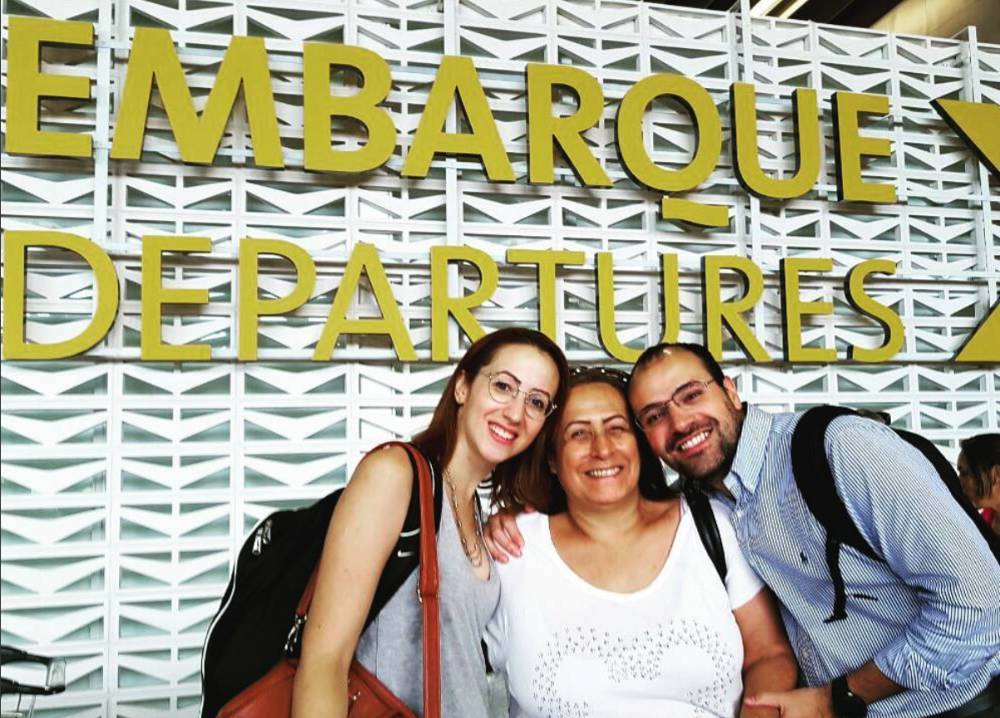

I also started listening much more to acoustic and instrumental music, as I realized it helped me focusing a lot.

In [23]:
d = {}

for i in years:
    d[i] = 0

tags_df = df['tags']
count_tags = {}

for i in range(len(df)):
    str1 = ast.literal_eval(tags_df.iloc[i])
    for j in range(len(str1)):
        if 'chill' in str1[j] or 'instrumental' in str1[j] or 'electro' in str1[j] or 'eletro' in str1[j]:
            d[df.iloc[i]['year']] += 1

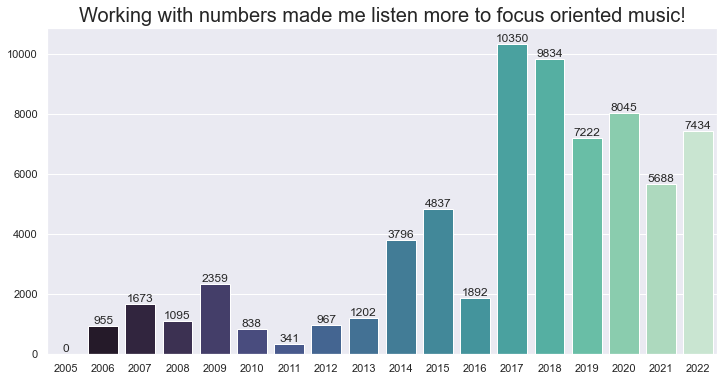

In [24]:
x_electro = list(d.values())
y_electro = list(d.keys())

sns.set()
plt.subplots(figsize=(12, 6))
yearly_tracks = sns.barplot(y_electro, x_electro, palette='mako')
yearly_tracks.set_title("Working with numbers made me listen more to focus oriented music!", fontsize=20)
for p in yearly_tracks.patches:
    yearly_tracks.text(p.get_x() + p.get_width()/2., p.get_height(), '%d' % int(p.get_height()), 
            fontsize=12, ha='center', va='bottom')

## 2022: a bike odyssey

During a complicated period of this year, I decided to apply all the adrenaline I was getting from my anxiety into sports. I tried to increase my HIIT sessions (that I don't particularly like), I tried spinning (that worked, but...) and I tried... cycling! I bought a road bike and it was love at first ride, literally. Since then (2 months, lol) I'm addicted to it. I always sucked at waking up early to practice sports, however I find myself jumping out of bed at 6am so I can ride at 7... and of course this is reflected into the music I'm listening to while riding. (Listen kids, while riding use just one headphone and in a low volume, you have to be paying attention and listening to the traffic!)

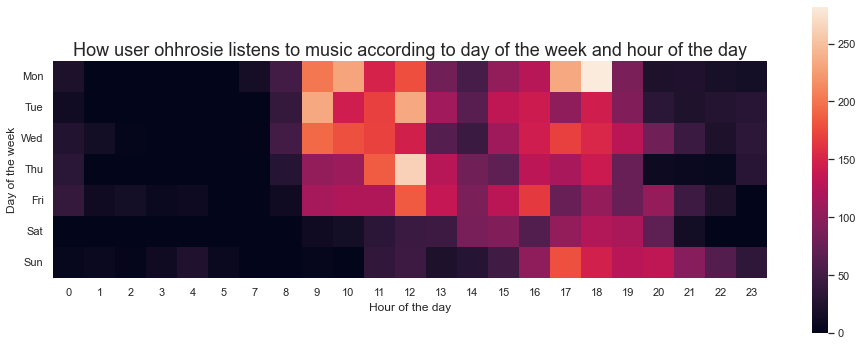

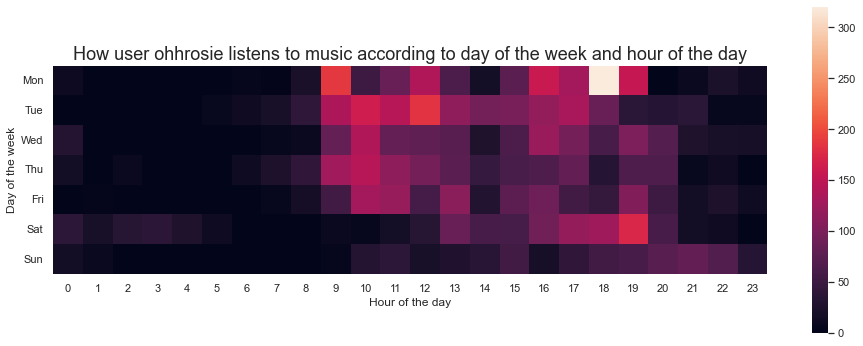

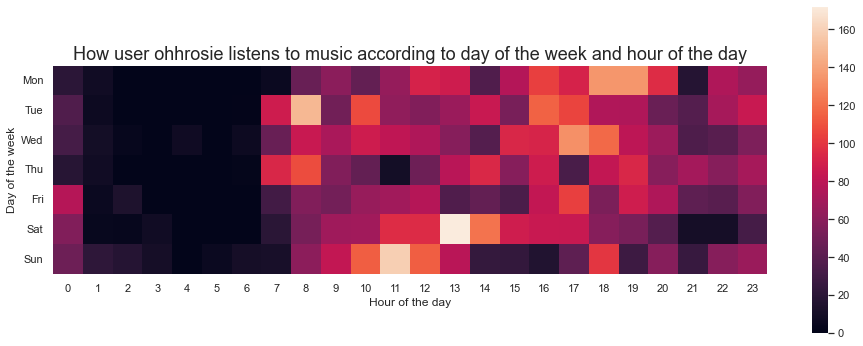

In [32]:
plot_heatmap(d20)
plot_heatmap(d21)
plot_heatmap(d22)

## The End!

This is my life in music until now. Here are some curious findings along the way.

In [33]:
years = sorted(list(df['year'].unique()))
scrobbles_per_year = {}

for i in years:
    scrobbles_per_year['tracks_' + str(i)] = df.loc[df['year'] == i]

dict_top_tracks = {}
for key, value in scrobbles_per_year.items():
    count = 0
    old_track = ''
    dict_tracks_per_year = {}
    for i in range(len(value['track'])):
        new_track = value.iloc[i]['track']
        if old_track == new_track:
            count += 1
            if count > 2: dict_tracks_per_year[(value.iloc[i]['artist'], value.iloc[i]['track'])] = count
        else:
            count = 0
        old_track = new_track
    sorted_dict = sorted(dict_tracks_per_year.items(), key=lambda x: x[1], reverse=True)
    dict_top_tracks[key[-4:]] = sorted_dict[:5]

for key, value in dict_top_tracks.items():
    if len(value) > 0:
        print('In', key, 'the most listened tracks on repeat were:')
        for item in value:
            print('"' + item[0][1] + '" by', item[0][0], item[1], 'times')
        print('')

In 2007 the most listened tracks on repeat were:
"The Mating Game" by Bitter:Sweet 3 times

In 2009 the most listened tracks on repeat were:
"Me Plus One" by Kasabian 10 times
"Club Foot" by Kasabian 10 times
"Underdog" by Kasabian 9 times
"Vlad the Impaler" by Kasabian 8 times
"Breakout" by Foo Fighters 8 times

In 2010 the most listened tracks on repeat were:
"Go Do" by Jónsi 8 times
"Animal Arithmetic" by Jónsi 8 times
"Boy Lilikoi" by Jónsi 8 times
"Sinking Friendships" by Jónsi 8 times
"Dia Perfeito" by Cachorro Grande 6 times

In 2011 the most listened tracks on repeat were:
"Beatles and Stones" by Beady Eye 12 times
"Millionaire" by Beady Eye 12 times
"The Roller" by Beady Eye 12 times
"My Fantasy" by Miles Kane 11 times
"If I Had a gun" by Noel Gallagher's High Flying Birds 11 times

In 2012 the most listened tracks on repeat were:
"Teddy Picker" by Arctic Monkeys 8 times
"Under My Thumb" by The Rolling Stones 3 times
"Undercover Martyn" by Two Door Cinema Club 3 times
"Fire" b

In [34]:
pv2 = pd.pivot_table(df, index='year', values=['danceability', 'energy', 'acousticness', 'instrumentalness'])[1:]
# , 'energy', 'key', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo

In [35]:
pv2 = pv2.reset_index()

pv3 = pv2[['year', 'danceability']]
pv3['type'] = ['danceability' for i in range(len(pv3))]
pv3 = pv3.rename(columns={"danceability": "value"})

pv4 = pv2[['year', 'energy']]
pv4['type'] = ['energy' for i in range(len(pv4))]
pv4 = pv4.rename(columns={"energy": "value"})

pv5 = pv2[['year', 'acousticness']]
pv5['type'] = ['acousticness' for i in range(len(pv5))]
pv5 = pv5.rename(columns={"acousticness": "value"})

pv6 = pv2[['year', 'instrumentalness']]
pv6['type'] = ['instrumentalness' for i in range(len(pv6))]
pv6 = pv6.rename(columns={"instrumentalness": "value"})

ValueError: cannot reindex on an axis with duplicate labels

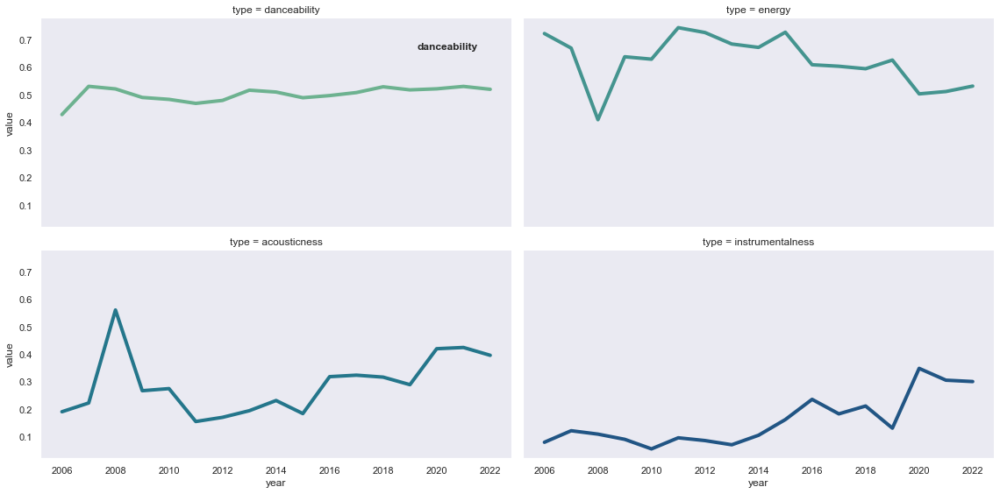

In [36]:
sp = pd.concat([pv3, pv4, pv5, pv6])

sns.set_theme(style="dark")

# Plot each year's time series in its own facet
g = sns.relplot(
    data=sp,
    x="year", y="value", col="type", hue="type",
    kind="line", palette="crest", linewidth=4, zorder=5,
    col_wrap=2, height=4, aspect=2, legend=False,
)

# Iterate over each subplot to customize further
for year, ax in g.axes_dict.items():

    # Add the title as an annotation within the plot
    ax.text(.8, .85, year, transform=ax.transAxes, fontweight="bold")

    # Plot every year's time series in the background
    sns.lineplot(
        data=sp, x="year", y="value", units="type",
        estimator=None, color=".7", linewidth=1, ax=ax,
    )

# Reduce the frequency of the x axis ticks
ax.set_xticks(ax.get_xticks()[::2])

# Tweak the supporting aspects of the plot
g.set_titles("")
g.set_axis_labels("", "Intensity")
g.tight_layout()

In [41]:
years = sorted(list(df['year'].unique()))[1:]
remove_tags = []
ye = []
tag = []
val = []
num_top = 20
for year in years:
    d = df[df.year == year]
    tags_df = d['tags']
    count_tags = {}

    for i in range(len(d)):
        str1 = ast.literal_eval(tags_df.iloc[i])
        for j in range(len(str1)):
            str1[j] = str1[j].replace(" ", "")
            if str1[j] not in count_tags:
                count_tags[str1[j]] = 1
            elif str1[j] in count_tags:
                count_tags[str1[j]] += 1

    top_tags = Counter(count_tags)
    top_100_tags = top_tags.most_common(num_top)

    x_tags = [item[0] for item in top_100_tags]
    y_tags = [item[1] for item in top_100_tags]
    years_l = [year for x in range(len(x_tags))]

    ye += years_l
    tag += x_tags
    val += y_tags

In [42]:
dtag = pd.DataFrame()
dtag['year'] = ye
dtag['tag'] = tag
dtag['scrobbles']= val

In [43]:
dtag['norm1']=(dtag['scrobbles']-dtag['scrobbles'].min())/(dtag['scrobbles'].max()-dtag['scrobbles'].min())
torem = ['oldies', 'electronica', 'rockandroll','beatles', 'manchester', 'instrumental', 'soul', 'blues',
         'progressiverock', 'swing', 'britishinvasion', 'classic', 'newwave', '80s', 'mellow', 'vocal',
        'vocaljazz', 'jazzvocal', 'female', 'chillout', 'jazz', 'folk', 'rocknroll']
dtag = dtag[~dtag.tag.isin(torem)]

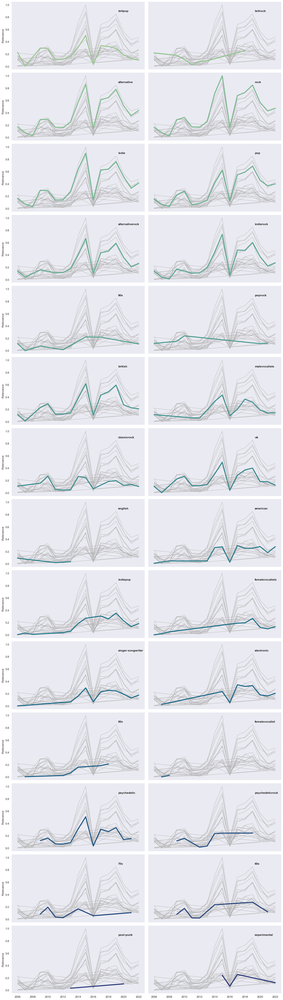

In [44]:
sns.set_theme(style="dark")

# Plot each year's time series in its own facet
g = sns.relplot(
    data=dtag,
    x="year", y="norm1", col="tag", hue="tag",
    kind="line", palette="crest", linewidth=4, zorder=5,
    col_wrap=2, height=4, aspect=2, legend=False,
)

# Iterate over each subplot to customize further
for year, ax in g.axes_dict.items():

    # Add the title as an annotation within the plot
    ax.text(.8, .85, year, transform=ax.transAxes, fontweight="bold")

    # Plot every year's time series in the background
    sns.lineplot(
        data=dtag, x="year", y="norm1", units="tag",
        estimator=None, color=".7", linewidth=1, ax=ax,
    )


# Tweak the supporting aspects of the plot
g.set_titles("")
g.set_axis_labels("", "Relevance")
g.tight_layout()